# Vacant Lots as Sites for Insurgent Strategies Toward Healing

##   Group: LandAccess4All
Lupe Rentreria Salome and Mel Liu

### How did both of us decide to map land in Los Angeles?

In 222A Histories and Theories of Planning, we learned about how research is often used to answer questions we already know the answers to. What both of us don't know the answer to is what are the possibilities for taking land back admidst housing shortages and privitazion, as well as goverment misuse of public lands. How could land exist outside colonial frameworks?

Urban planning is results from contestation of spaces and visions. Despite contenstation, how might be be able to hold space for collaoration and community? How many and what types of vacant lots exists?

We hope that making a map of vacant land parcels available to community members who are building people power through land trusts, and seeking rematriation efforts, can benefit from this information.

## Our Data

### [Vacant Parcels from the County Assessor](https://data.lacounty.gov/Parcel-/Vacant-Parcels-LA-County-from-ASR-Use-Code/vcaw-zeg9)

"Valuation and property description for parcels on the Assessor's annual secured assessment roll for 2015."

*The file was close to 75 mb, I reduced down to 39 mb by deleting empty or redundant columns first. I will refer to the above link for the metadata on the meaning of the other columns.

### [Vacant Land Data: Community Boundaries](https://data.lacounty.gov/GIS-Data/Community-Boundaries-CSA-/g4rb-en2z)

Communities are one of the most complex geographic issues in the County of Los Angeles, due to historical narratives, perceptions of value, intense public interest, and shifts over time. The County has a need to establish a consistent geographic reporting base that will enable statistics and information to reported to the Board, that attempts to represent all of the interactions but is primarily focused on reporting.

In [1]:
# libraries
import urllib.request, json 
import pandas as pd
import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt
from sodapy import Socrata

/opt/conda/lib/python3.9/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


In [2]:
# api url for vacant lots
vac_url = 'https://data.lacounty.gov/resource/vcaw-zeg9.json'

# call the api and bring the data in
with urllib.request.urlopen(vac_url) as url:
    vacdata = json.loads(url.read().decode())

# convert the data to a dataframe
vacdf = pd.json_normalize(vacdata)

In [3]:
vacdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 57 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   usecodedescchar1             1000 non-null   object
 1   roll_homeownersexemp         1000 non-null   object
 2   situsunit                    1000 non-null   object
 3   recordingdate                1000 non-null   object
 4   effectiveyearbuilt           1000 non-null   object
 5   :@computed_region_gj26_y8x3  1000 non-null   object
 6   istaxableparcel              1000 non-null   object
 7   roll_totlandimp              1000 non-null   object
 8   roll_perspropexemp           1000 non-null   object
 9   parcelboundarydescription    1000 non-null   object
 10  roll_landbaseyear            1000 non-null   object
 11  situscity                    1000 non-null   object
 12  roll_impbaseyear             1000 non-null   object
 13  usetype                      1000 

In [4]:
# convert df to gdf for vacant parcels
# since data is in lat/lon's assign the crs to WGS84 (epsg:4326)
vacgdf = gpd.GeoDataFrame(vacdf, 
                       crs='epsg:4326',
                       geometry=gpd.points_from_xy(vacdf.center_lon, vacdf.center_lat))

In [5]:
# output the data's projection
vacgdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## Mapping the Data
### adding a basemap

In [6]:
# reproject to web mercator
vacgdf_web_mercator = vacgdf.to_crs(epsg=3857)

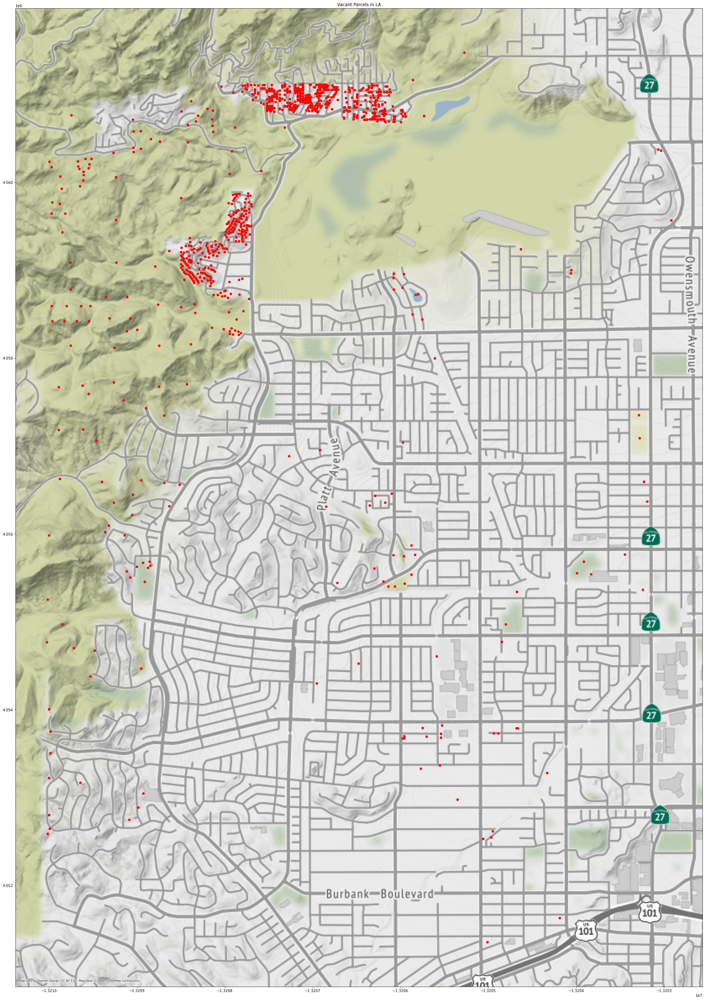

In [7]:
# map the vacant parcels
fig, ax = plt.subplots(figsize=(50,50))

vacgdf_web_mercator.plot(ax=ax,
                      color='red')

ax.axis('on')

ax.set_title('Vacant Parcels in LA')

ctx.add_basemap(ax)

### seems like the map is in a focused area. After googling the streets, we found out it was by Thousand Oaks Valley. We are wondering if we can shift the center by using location parameter when calling in API data.

Now, we are going to import the community boundaries, and set and merge both.

In [8]:
#Time to import the community boundaries data set

comgdf = gpd.read_file("Community Boundaries (CSA) (1).geojson")

In [46]:
type (comgdf)

geopandas.geodataframe.GeoDataFrame

In [10]:
comgdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 348 entries, 0 to 347
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   community       261 non-null    object  
 1   source          348 non-null    object  
 2   label           348 non-null    object  
 3   city_type       348 non-null    object  
 4   objectid        348 non-null    object  
 5   lcity           348 non-null    object  
 6   shape_stlength  348 non-null    object  
 7   shape_starea    348 non-null    object  
 8   geometry        348 non-null    geometry
dtypes: geometry(1), object(8)
memory usage: 24.6+ KB


In [11]:
list(comgdf)

['community',
 'source',
 'label',
 'city_type',
 'objectid',
 'lcity',
 'shape_stlength',
 'shape_starea',
 'geometry']

<AxesSubplot:>

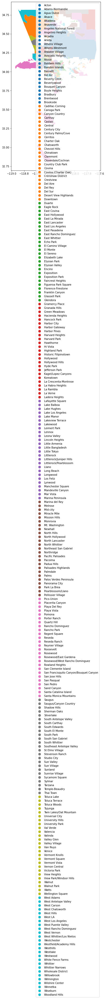

In [12]:
#let's map the community boundaries geodataframe

comgdf.plot(figsize=(12,12),
                          column='community',
                          legend=True)

### Adding Basemap 
We mapped the community boundaries and vacant lot parcels at large.

In [13]:
# now let's project to web mercator 
comgdf_wm = comgdf.to_crs(epsg=3857)

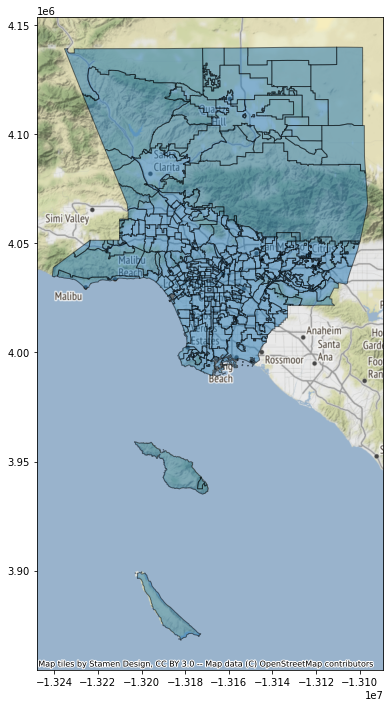

In [14]:
# Great, looks like it's all set

ax = comgdf_wm.plot(figsize=(12, 12), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax) 

Yay! it is a very zoomed out map, but it is the first time we do it! 

In [15]:
# conduct a spatial join (i.e. assign each arrest to the neighborhood it is in)
vac_by_com = gpd.sjoin(comgdf, vacgdf) #Spatial join Points to polygons
vac_by_com

,community,source,label,city_type,objectid,lcity,shape_stlength,shape_starea,geometry,index_right,...,situsdirection,roll_realestateexemp,center_lat,situszip,yearbuilt,location_1.latitude,location_1.needs_recoding,location_1.longitude,propertylocation,situszip5
85,Canoga Park,LA City,Los Angeles - Canoga Park,City,61,Los Angeles,57957.649654091998,128293030.19238281,"MULTIPOLYGON (((-118.59255 34.23546, -118.5924...",916,...,,0,34.19759028,,0,34.19759028,False,-118.60674292,NaN,NaN
85,Canoga Park,LA City,Los Angeles - Canoga Park,City,61,Los Angeles,57957.649654091998,128293030.19238281,"MULTIPOLYGON (((-118.59255 34.23546, -118.5924...",919,...,,0,34.19889880,,0,34.1988988,False,-118.61205388,NaN,NaN
85,Canoga Park,LA City,Los Angeles - Canoga Park,City,61,Los Angeles,57957.649654091998,128293030.19238281,"MULTIPOLYGON (((-118.59255 34.23546, -118.5924...",920,...,,0,34.19900097,,0,34.19900097,False,-118.61349666,NaN,NaN
85,Canoga Park,LA City,Los Angeles - Canoga Park,City,61,Los Angeles,57957.649654091998,128293030.19238281,"MULTIPOLYGON (((-118.59255 34.23546, -118.5924...",918,...,,0,34.19997855,,0,34.19997855,False,-118.61279891,NaN,NaN
85,Canoga Park,LA City,Los Angeles - Canoga Park,City,61,Los Angeles,57957.649654091998,128293030.19238281,"MULTIPOLYGON (((-118.59255 34.23546, -118.5924...",917,...,,0,34.20058374,91303-1136,0,34.20058374,False,-118.60858656,22112 SHERMAN WAY LOS ANGELES CA 91303,91303
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,West Hills,LA City,Los Angeles - West Hills,City,174,Los Angeles,105989.43541216178,278714351.12011719,"MULTIPOLYGON (((-118.60490 34.23545, -118.6045...",556,...,,0,34.23104921,,0,34.23104921,False,-118.64800086,NaN,NaN
346,West Hills,LA City,Los Angeles - West Hills,City,174,Los Angeles,105989.43541216178,278714351.12011719,"MULTIPOLYGON (((-118.60490 34.23545, -118.6045...",554,...,,0,34.23111308,,0,34.23111308,False,-118.64712947,NaN,NaN
346,West Hills,LA City,Los Angeles - West Hills,City,174,Los Angeles,105989.43541216178,278714351.12011719,"MULTIPOLYGON (((-118.60490 34.23545, -118.6045...",558,...,,0,34.23104672,,0,34.23104672,False,-118.64843543,NaN,NaN
346,West Hills,LA City,Los Angeles - West Hills,City,174,Los Angeles,105989.43541216178,278714351.12011719,"MULTIPOLYGON (((-118.60490 34.23545, -118.6045...",656,...,,0,34.23299360,,0,34.2329936,False,-118.64576933,NaN,NaN


We are also reminded that we are limited in data. 

In [16]:
vac_count = vac_by_com.value_counts('community').reset_index(name='vac_count')
vac_count

,community,vac_count
0,Lake Manor,560
1,West Hills,336
2,West Chatsworth,64
3,Woodland Hills,25
4,Canoga Park,9
5,Westhills,5
6,Chatsworth,1


In [17]:
# add the count to the neighborhoods
comgdf = comgdf.merge(vac_count, how='left', on='community')

In [18]:
comgdf.sample(10)

,community,source,label,city_type,objectid,lcity,shape_stlength,shape_starea,geometry,vac_count
104,Rosewood/West Rancho Dominguez,BOS,Unincorporated - Rosewood/West Rancho Dominguez,Unincorporated,301,Unincorporated,15582.170091909344,12928298.576171875,"MULTIPOLYGON (((-118.25999 33.89491, -118.2601...",NaN
220,St Elmo Village,LA City,Los Angeles - St Elmo Village,City,147,Los Angeles,8771.4289996116095,4181467.2060546875,"MULTIPOLYGON (((-118.33980 34.03984, -118.3404...",NaN
139,Reseda Ranch,LA City,Los Angeles - Reseda Ranch,City,139,Los Angeles,19423.146096235865,20059159.659179688,"MULTIPOLYGON (((-118.56227 34.21202, -118.5622...",NaN
174,Exposition,LA City,Los Angeles - Exposition,City,82,Los Angeles,13747.787962368369,9822071.76171875,"MULTIPOLYGON (((-118.34603 34.02149, -118.3461...",NaN
259,West LA,BOS,Unincorporated - West LA,Unincorporated,330,Unincorporated,29539.957788213746,25141186.115234375,"MULTIPOLYGON (((-118.46289 34.06348, -118.4628...",NaN
35,West Whittier/Los Nietos,BOS,Unincorporated - West Whittier/Los Nietos,Unincorporated,333,Unincorporated,73679.802888047358,72391282.141601563,"MULTIPOLYGON (((-118.06524 33.99427, -118.0669...",NaN
347,None,BOS,City of Burbank,City,12,Burbank,102151.39667725106,483502845.6328125,"MULTIPOLYGON (((-118.30780 34.16116, -118.3080...",NaN
205,North Hollywood,LA City,Los Angeles - North Hollywood,City,124,Los Angeles,108271.62989003453,315116906.96679688,"MULTIPOLYGON (((-118.38778 34.22252, -118.3877...",NaN
172,None,BOS,City of Duarte,City,23,Duarte,111724.01660933453,186485252.14746094,"MULTIPOLYGON (((-117.92476 34.16531, -117.9248...",NaN
167,North Whittier,BOS,Unincorporated - North Whittier,Unincorporated,287,Unincorporated,35228.679561321529,35900925.151367188,"MULTIPOLYGON (((-117.99044 34.03085, -117.9916...",NaN


<AxesSubplot:>

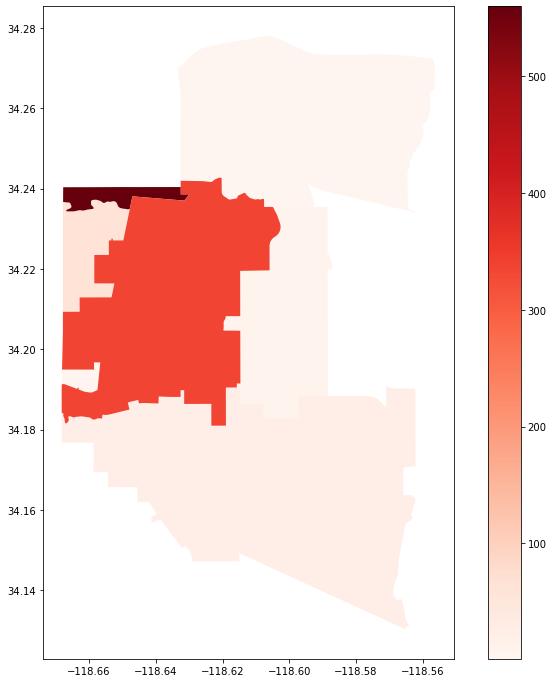

In [19]:
# choropleth map of vacant lots by community boundary
fig,ax = plt.subplots(figsize=(12,12))

comgdf.plot(ax=ax,column='vac_count',legend=True,cmap='Reds')

/opt/conda/lib/python3.9/site-packages/contextily/tile.py:581: UserWarning: The inferred zoom level of 30 is not valid for the current tile provider (valid zooms: 0 - 18).
  warnings.warn(msg)


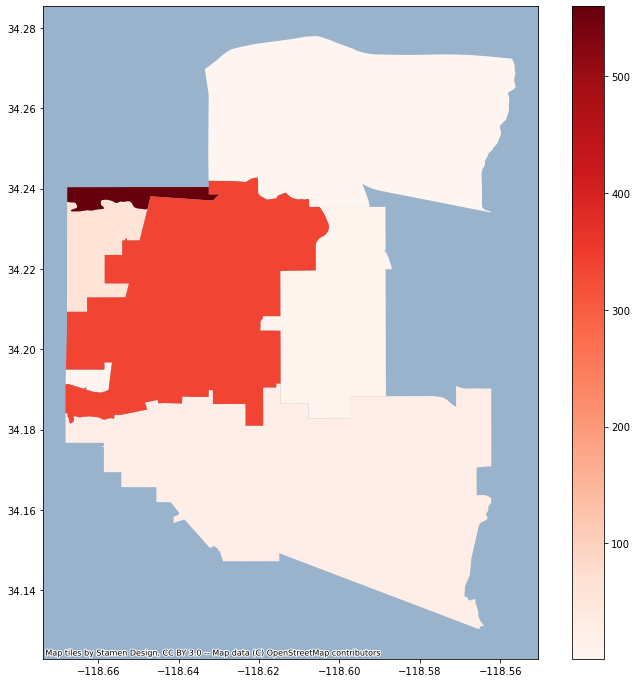

In [20]:
# choropleth map of arrests by neighborhoods
fig,ax = plt.subplots(figsize=(12,12))

comgdf.plot(ax=ax,column='vac_count',legend=True,cmap='Reds')

ctx.add_basemap(ax)

We are running into issues adding a basemap here. We are wondering if we need to do the (x_lim etc.) command that can help center. Lupe was also running into this issue when adding a basemap to specific census tracts.

## Using Plotly to graph

In [21]:
# for data wrangling
import pandas as pd

# for interactive plots
import plotly.express as px

# to import open data
from sodapy import Socrata

### calling in data from LA County's Socrata portal

We are going to call in the vacant parcel data again. We tried 5000 to see how many parcels we could get without overwhelming our jupyter notebook and memory.

In [22]:
# connect to the data portal
client = Socrata("data.lacounty.gov", None)

# First 5000 results, returned as JSON from API / converted to Python list of
# dictionaries by sodapy.
results = client.get("vcaw-zeg9", limit=5000, )

# Convert to pandas DataFrame
vacant_parcels = pd.DataFrame.from_records(results)

vacant_parcels.sample(2)

,usecodedescchar1,roll_homeownersexemp,situsunit,recordingdate,effectiveyearbuilt,:@computed_region_gj26_y8x3,istaxableparcel,roll_totlandimp,roll_perspropexemp,parcelboundarydescription,...,location_1,bathrooms,sqftmain,situsdirection,roll_realestateexemp,center_lat,situszip,yearbuilt,propertylocation,situszip5
490,Residential,0,,19970702,0,195,Y,3604,0,CHATSWORTH LAKE MANOR E 25 FT OF LOT 7 BLK ...,...,"{'latitude': '34.23735382', 'needs_recoding': ...",0,0,,0,34.23735382,,0,NaN,NaN
3781,Residential,0,,20110815,0,69,Y,47306,0,TRACT NO 6170 NE 50 FT MEASURED ON SE LINE OF ...,...,"{'latitude': '34.15871134', 'needs_recoding': ...",0,0,,0,34.15871134,,0,NaN,NaN


In using API it chooses what data for 5000 rows we called in. In the future, we would like to see how we could use API to select more specific parameters by column headers that don't have string or interger data.

In [23]:
# Convert to pandas DataFrame
vacant_parcels = pd.DataFrame.from_records(vacant_parcels)

In [24]:
# how many rows and columns?
vacant_parcels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 55 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   usecodedescchar1             5000 non-null   object
 1   roll_homeownersexemp         5000 non-null   object
 2   situsunit                    5000 non-null   object
 3   recordingdate                5000 non-null   object
 4   effectiveyearbuilt           5000 non-null   object
 5   :@computed_region_gj26_y8x3  4995 non-null   object
 6   istaxableparcel              5000 non-null   object
 7   roll_totlandimp              5000 non-null   object
 8   roll_perspropexemp           5000 non-null   object
 9   parcelboundarydescription    5000 non-null   object
 10  roll_landbaseyear            5000 non-null   object
 11  situscity                    5000 non-null   object
 12  roll_impbaseyear             5000 non-null   object
 13  usetype                      5000

In [25]:
# what fields and datatypes?

vacant_parcels.dtypes

usecodedescchar1               object
roll_homeownersexemp           object
situsunit                      object
recordingdate                  object
effectiveyearbuilt             object
:@computed_region_gj26_y8x3    object
istaxableparcel                object
roll_totlandimp                object
roll_perspropexemp             object
parcelboundarydescription      object
roll_landbaseyear              object
situscity                      object
roll_impbaseyear               object
usetype                        object
usecodedescchar3               object
cluster                        object
adminregion                    object
roll_fixtureexemp              object
nettaxablevalue                object
taxratearea                    object
rowid                          object
:@computed_region_pft9_733t    object
:@computed_region_x8wy_s94z    object
roll_landvalue                 object
units                          object
taxratearea_city               object
situsfractio

In [26]:
vacant_parcels.columns

Index(['usecodedescchar1', 'roll_homeownersexemp', 'situsunit',
       'recordingdate', 'effectiveyearbuilt', ':@computed_region_gj26_y8x3',
       'istaxableparcel', 'roll_totlandimp', 'roll_perspropexemp',
       'parcelboundarydescription', 'roll_landbaseyear', 'situscity',
       'roll_impbaseyear', 'usetype', 'usecodedescchar3', 'cluster',
       'adminregion', 'roll_fixtureexemp', 'nettaxablevalue', 'taxratearea',
       'rowid', ':@computed_region_pft9_733t', ':@computed_region_x8wy_s94z',
       'roll_landvalue', 'units', 'taxratearea_city', 'situsfraction',
       'roll_impvalue', 'usecode', 'situsstreet', 'parcelclassification',
       'assessorid', 'roll_perspropvalue', 'usecodedescchar2', 'bedrooms',
       'roll_totalvalue', 'rollyear', 'ain', 'situshouseno',
       'roll_fixturevalue', 'usecodedescchar4', 'center_lon',
       ':@computed_region_cbw7_skn5', 'roll_totalexemption',
       'totbuildingdatalines', 'location_1', 'bathrooms', 'sqftmain',
       'situsdirection',

In [27]:
vacant_parcels.head()

,usecodedescchar1,roll_homeownersexemp,situsunit,recordingdate,effectiveyearbuilt,:@computed_region_gj26_y8x3,istaxableparcel,roll_totlandimp,roll_perspropexemp,parcelboundarydescription,...,location_1,bathrooms,sqftmain,situsdirection,roll_realestateexemp,center_lat,situszip,yearbuilt,propertylocation,situszip5
0,Residential,0,,20061005,0,441,Y,350000,0,TR=25040 LOT A,...,"{'latitude': '34.22637172', 'needs_recoding': ...",0,0,,0,34.22637172,,0,NaN,NaN
1,Residential,0,,19991216,0,441,N,0,0,TR=20269 LOT 22,...,"{'latitude': '34.22434155', 'needs_recoding': ...",0,0,,0,34.22434155,91304-2202,0,22345 MALDEN ST LOS ANGELES CA 91304,91304
2,Residential,0,,20001114,0,441,N,0,0,TR=25303 LOT 28,...,"{'latitude': '34.22463491', 'needs_recoding': ...",0,0,,0,34.22463491,91304-2209,0,22322 NAPA ST LOS ANGELES CA 91304,91304
3,Residential,0,,19680828,0,441,Y,0,0,TRACT NO 25762 LOT A,...,"{'latitude': '34.22088443', 'needs_recoding': ...",0,0,,0,34.22088443,,0,NaN,NaN
4,Residential,0,,19680828,0,441,Y,0,0,TRACT NO 25762 LOT B,...,"{'latitude': '34.2204443', 'needs_recoding': F...",0,0,,0,34.22044430,,0,NaN,NaN


### we shorten our data set to remove a few columns that we did not need. 

There were originally 55 column headers, with many not applicable as the assessor uses these same columes for non-vacant parcels as well.

In [28]:
vac_par2 = vacant_parcels[['usecodedescchar1', 
                           'situscity', 
                           'usetype', 'cluster', 
                           'adminregion', 
                           'taxratearea',
                           'rowid', 
                           'taxratearea_city', 
                           'usecode', 
                           'parcelclassification', 
                           'center_lon', 
                           'center_lat', 
                           'situszip', 
                           'situszip5']]

In [29]:
vac_par2.head()

,usecodedescchar1,situscity,usetype,cluster,adminregion,taxratearea,rowid,taxratearea_city,usecode,parcelclassification,center_lon,center_lat,situszip,situszip5
0,Residential,,VAC,02121,02,00016,20152004015041,LOS ANGELES,010V,,-118.61923487,34.22637172,,NaN
1,Residential,LOS ANGELES CA,VAC,02121,02,00016,20152004018900,LOS ANGELES,010V,Public (non-taxable government-owned),-118.61411005,34.22434155,91304-2202,91304
2,Residential,LOS ANGELES CA,VAC,02121,02,00016,20152004018902,LOS ANGELES,010V,Public (non-taxable government-owned),-118.61407872,34.22463491,91304-2209,91304
3,Residential,,VAC,02121,02,00016,20152005003037,LOS ANGELES,010V,,-118.63029295,34.22088443,,NaN
4,Residential,,VAC,02121,02,00016,20152005003038,LOS ANGELES,010V,,-118.62931438,34.22044430,,NaN


In [30]:
# how many rows and columns?
vac_par2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   usecodedescchar1      5000 non-null   object
 1   situscity             5000 non-null   object
 2   usetype               5000 non-null   object
 3   cluster               5000 non-null   object
 4   adminregion           5000 non-null   object
 5   taxratearea           5000 non-null   object
 6   rowid                 5000 non-null   object
 7   taxratearea_city      5000 non-null   object
 8   usecode               5000 non-null   object
 9   parcelclassification  5000 non-null   object
 10  center_lon            4995 non-null   object
 11  center_lat            4995 non-null   object
 12  situszip              5000 non-null   object
 13  situszip5             340 non-null    object
dtypes: object(14)
memory usage: 547.0+ KB


### now, we are going to create a few graphs

using the magic of plotly!

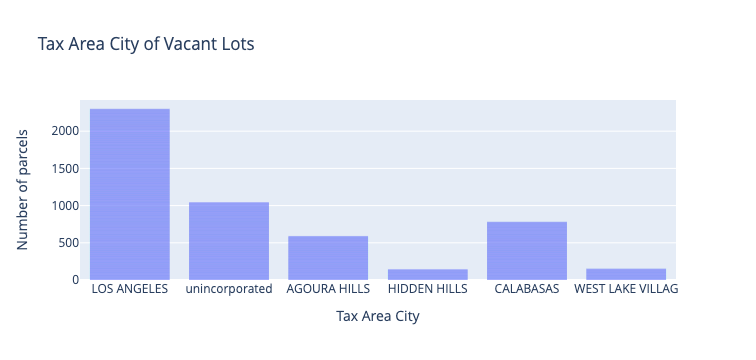

In [31]:
# add labels by providing a dict
fig = px.bar(
        vac_par2,
       x='taxratearea_city',
       title='Tax Area City of Vacant Lots',
        labels={
            'taxratearea_city':'Tax Area City',
            'count':'Number of parcels'
        }
)

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

We graphed the area by 'taxratearea_city' that gave us more insight on the location of the vacant lot parcels by neighborhoood/community boundary. 

Unsuprisingly we wee that Los Angeles incorporated has the most parcels. Once we spatialize this, we will get further insights. But this tells us that of the 5000 rows, we called in a lot within the incorporated boundaries of LA City.

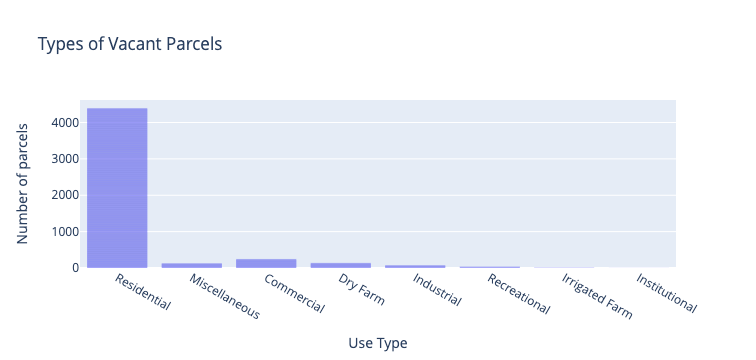

In [32]:
# add labels by providing a dict
fig = px.bar(
        vac_par2,
       x='usecodedescchar1',
       title='Types of Vacant Parcels ',
        labels={
            'usecodedescchar1':'Use Type',
            'count':'Number of parcels'
        }
)

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

Now we get a better perspective of the assigned use of the vacant land. It is not surprising that it is for residential in a city of Los Angeles (unless we landed on data from City of Industry). Now let's map to see what section of the county our data is located in...

In [33]:
# convert lat/lon's to floats, as we saw the object type needs to be converted
vac_par2['center_lat'] = vac_par2['center_lat'].astype(float)
vac_par2['center_lon'] = vac_par2['center_lon'].astype(float)
vac_par2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   usecodedescchar1      5000 non-null   object 
 1   situscity             5000 non-null   object 
 2   usetype               5000 non-null   object 
 3   cluster               5000 non-null   object 
 4   adminregion           5000 non-null   object 
 5   taxratearea           5000 non-null   object 
 6   rowid                 5000 non-null   object 
 7   taxratearea_city      5000 non-null   object 
 8   usecode               5000 non-null   object 
 9   parcelclassification  5000 non-null   object 
 10  center_lon            4995 non-null   float64
 11  center_lat            4995 non-null   float64
 12  situszip              5000 non-null   object 
 13  situszip5             340 non-null    object 
dtypes: float64(2), object(12)
memory usage: 547.0+ KB


/tmp/ipykernel_1656/1603981512.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1656/1603981512.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



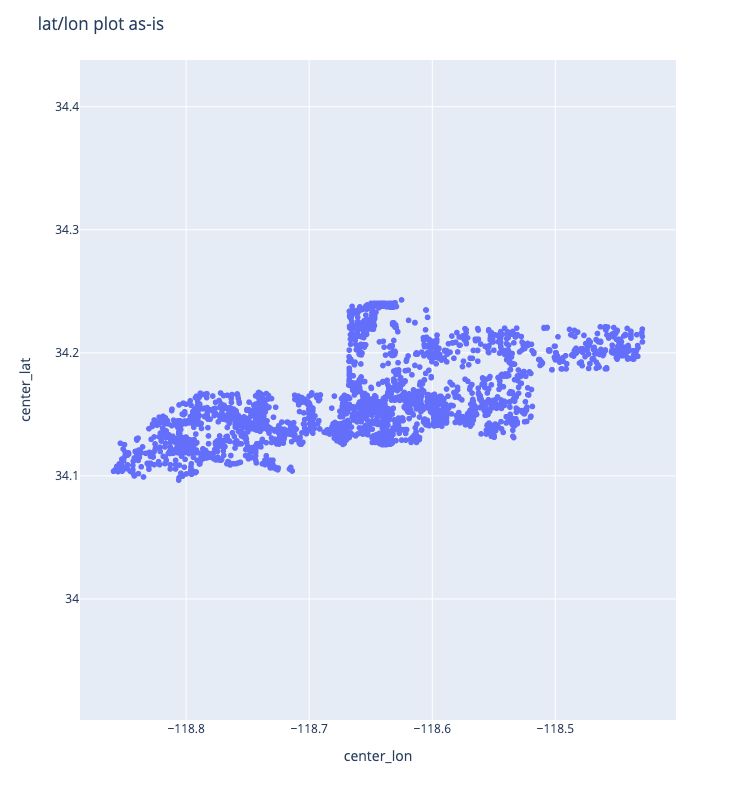

In [34]:
# plot it
fig = px.scatter(vac_par2,
           x='center_lon',
           y='center_lat'
)

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "lat/lon plot as-is"
)

# make it a square grid
fig.update_yaxes(
    scaleanchor = "x",
    scaleratio = 1,
)

fig.show()

Now, we see all the vacant land in an area within certain longitute and latitude. Where in LA county might we be??

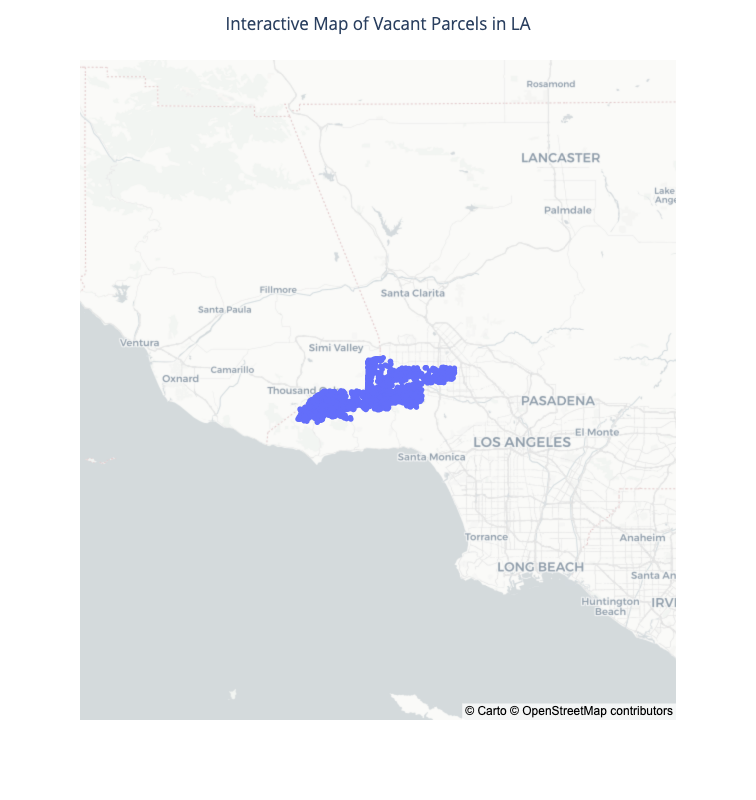

In [35]:
fig = px.scatter_mapbox(vac_par2,
                        lat='center_lat',
                        lon='center_lon',
                        mapbox_style="carto-positron")

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "Interactive Map of Vacant Parcels in LA",
    title_x=0.5 # aligns title to center
)

fig.show()


we can zoom in and out to see that we're in the northwest corner of LA county by the Santa Monica mountains!

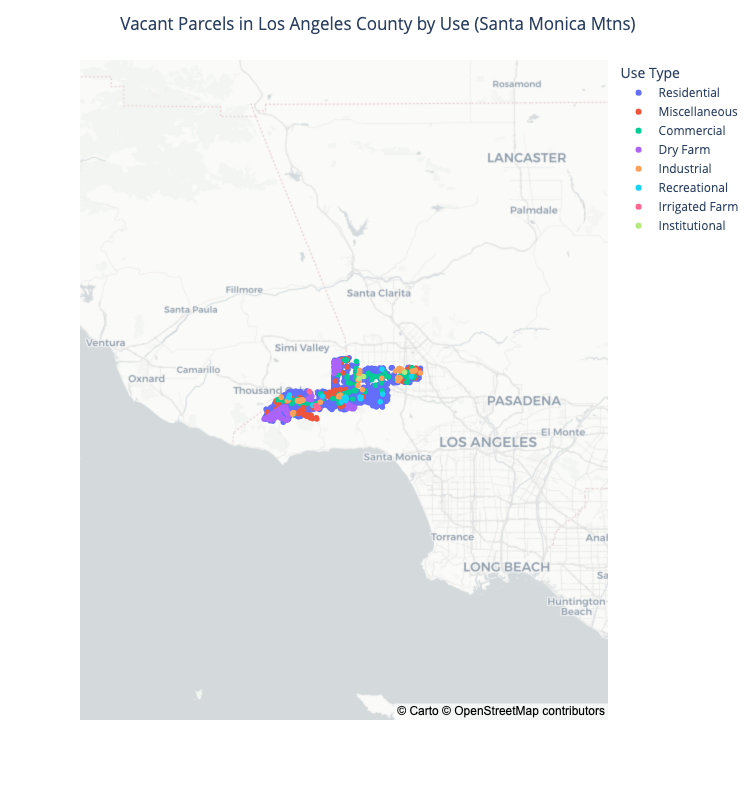

In [36]:
# what will se see next, perhaps type of parcels???
fig = px.scatter_mapbox(vac_par2, 
                        lat="center_lat", 
                        lon="center_lon", 
                        color="usecodedescchar1",
                        labels={'usecodedescchar1':'Use Type'},
                        mapbox_style="carto-positron"
                       )

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "Vacant Parcels in Los Angeles County by Use (Santa Monica Mtns)",
    title_x=0.5 # aligns title to center
)


fig.show()

As our graph earlier showed, there are alot more residential vacant parcels. Totally makes sense that some parcels are for agricultural use.

Below we will map the community boundaries to see neighborhood boundaries with the vacant parcels

In [37]:
#setting to web mercator projection for compatibility
comgdf_wm = comgdf.to_crs(epsg=3857)

<AxesSubplot:>

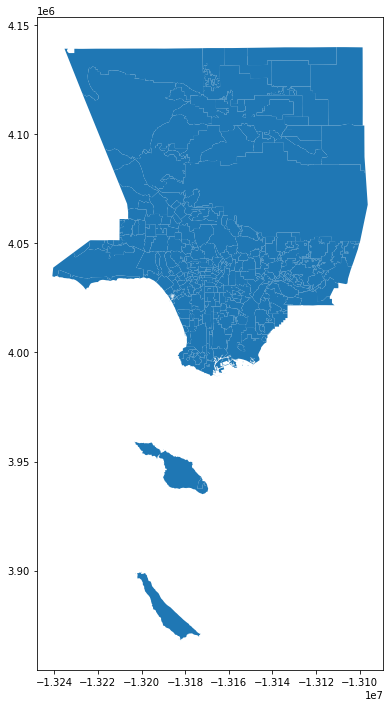

In [38]:
#let's plot this
comgdf_wm.plot(figsize=(12,12))


<AxesSubplot:>

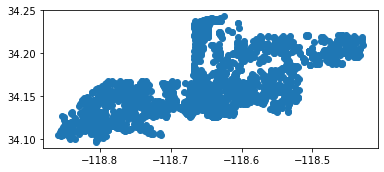

In [39]:
# convert vac_par2 to geodataframe
vacantgdf = gpd.GeoDataFrame(
    vac_par2, geometry=gpd.points_from_xy(vac_par2.center_lon, vac_par2.center_lat),crs=4326)

# check that it can be mapped
vacantgdf.plot()

In [40]:
# conduct a spatial join each parcel to the neighborhood it is in
vacant_by_community = gpd.sjoin(comgdf, vacantgdf) #Spatial join Points to polygons
vacant_by_community

,community,source,label,city_type,objectid,lcity,shape_stlength,shape_starea,geometry,vac_count,...,adminregion,taxratearea,rowid,taxratearea_city,usecode,parcelclassification,center_lon,center_lat,situszip,situszip5
0,None,BOS,City of Agoura Hills,City,1,Agoura Hills,80374.083443170195,217940117.12695313,"MULTIPOLYGON (((-118.72864 34.16793, -118.7286...",NaN,...,02,02387,20152063037900,AGOURA HILLS,010V,Public (non-taxable government-owned),-118.723996,34.126597,,NaN
0,None,BOS,City of Agoura Hills,City,1,Agoura Hills,80374.083443170195,217940117.12695313,"MULTIPOLYGON (((-118.72864 34.16793, -118.7286...",NaN,...,02,02387,20152063037051,AGOURA HILLS,010V,,-118.721031,34.126642,,NaN
0,None,BOS,City of Agoura Hills,City,1,Agoura Hills,80374.083443170195,217940117.12695313,"MULTIPOLYGON (((-118.72864 34.16793, -118.7286...",NaN,...,02,02387,20152063037052,AGOURA HILLS,010V,,-118.721885,34.127108,,NaN
0,None,BOS,City of Agoura Hills,City,1,Agoura Hills,80374.083443170195,217940117.12695313,"MULTIPOLYGON (((-118.72864 34.16793, -118.7286...",NaN,...,02,13954,20152063037053,AGOURA HILLS,010V,,-118.722917,34.127813,,NaN
0,None,BOS,City of Agoura Hills,City,1,Agoura Hills,80374.083443170195,217940117.12695313,"MULTIPOLYGON (((-118.72864 34.16793, -118.7286...",NaN,...,02,13954,20152063037060,AGOURA HILLS,010V,,-118.722988,34.128942,,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,West Hills,LA City,Los Angeles - West Hills,City,174,Los Angeles,105989.43541216178,278714351.12011719,"MULTIPOLYGON (((-118.60490 34.23545, -118.6045...",336.0,...,02,00016,20152017020025,LOS ANGELES,010V,,-118.651322,34.226881,,NaN
346,West Hills,LA City,Los Angeles - West Hills,City,174,Los Angeles,105989.43541216178,278714351.12011719,"MULTIPOLYGON (((-118.60490 34.23545, -118.6045...",336.0,...,02,00016,20152017020048,LOS ANGELES,010V,,-118.651993,34.226959,,NaN
346,West Hills,LA City,Los Angeles - West Hills,City,174,Los Angeles,105989.43541216178,278714351.12011719,"MULTIPOLYGON (((-118.60490 34.23545, -118.6045...",336.0,...,02,00016,20152017016900,LOS ANGELES,880V,Public (non-taxable government-owned),-118.653028,34.226987,,NaN
346,West Hills,LA City,Los Angeles - West Hills,City,174,Los Angeles,105989.43541216178,278714351.12011719,"MULTIPOLYGON (((-118.60490 34.23545, -118.6045...",336.0,...,02,00016,20152017009900,LOS ANGELES,880V,Public (non-taxable government-owned),-118.653080,34.227333,,NaN


In [41]:
# count the number of parcels per community
vacant_count = vacant_by_community.value_counts('community').reset_index(name='vacant_count')
vacant_count

,community,vacant_count
0,Woodland Hills,1026
1,Lake Manor,560
2,Santa Monica Mountains,417
3,West Hills,336
4,Van Nuys,322
5,Tarzana,160
6,Reseda,103
7,Encino,83
8,Canoga Park,80
9,Lake Balboa,70


In [42]:
# add the vacant parcel count to the neighborhoods
comgdf = comgdf.merge(vacant_count, how='left', on='community')

In [43]:
#check with a sample of our data

comgdf.sample(10)

,community,source,label,city_type,objectid,lcity,shape_stlength,shape_starea,geometry,vac_count,vacant_count
14,Van Nuys,LA City,Los Angeles - Van Nuys,City,164,Los Angeles,92099.630214654186,205583079.79882813,"MULTIPOLYGON (((-118.46773 34.22142, -118.4677...",NaN,322.0
221,None,BOS,City of Rolling Hills Estates,City,200,Rolling Hills Estates,122666.53995315013,100243087.89550781,"MULTIPOLYGON (((-118.35105 33.79521, -118.3501...",NaN,NaN
329,Highland Park,LA City,Los Angeles - Highland Park,City,97,Los Angeles,56286.555251530954,84518883.509765625,"MULTIPOLYGON (((-118.16802 34.12393, -118.1680...",NaN,NaN
192,Newhall,BOS,Unincorporated - Newhall,Unincorporated,285,Unincorporated,37297.269546757918,35923948.8984375,"MULTIPOLYGON (((-118.50945 34.34144, -118.5094...",NaN,NaN
91,Boyle Heights,LA City,Los Angeles - Boyle Heights,City,57,Los Angeles,59921.340929889084,144046936.58105469,"MULTIPOLYGON (((-118.19675 34.06452, -118.1926...",NaN,NaN
218,Beverlywood,LA City,Los Angeles - Beverlywood,City,56,Los Angeles,33551.265738734248,29915304.194335938,"MULTIPOLYGON (((-118.38778 34.05709, -118.3878...",NaN,NaN
196,None,BOS,City of Baldwin Park,City,7,Baldwin Park,87241.432741423472,188966247.65527344,"MULTIPOLYGON (((-117.94876 34.09238, -117.9487...",NaN,NaN
31,Hyde Park,LA City,Los Angeles - Hyde Park,City,101,Los Angeles,38424.76819531912,56911382.912109375,"MULTIPOLYGON (((-118.31712 33.99504, -118.3171...",NaN,NaN
207,Mar Vista,LA City,Los Angeles - Mar Vista,City,116,Los Angeles,51028.698407409021,98062542.666015625,"MULTIPOLYGON (((-118.42992 34.02686, -118.4301...",NaN,NaN
303,Victoria Park,LA City,Los Angeles - Victoria Park,City,170,Los Angeles,16048.682029533753,11235374.522460938,"MULTIPOLYGON (((-118.31759 34.04717, -118.3176...",NaN,NaN


<AxesSubplot:>

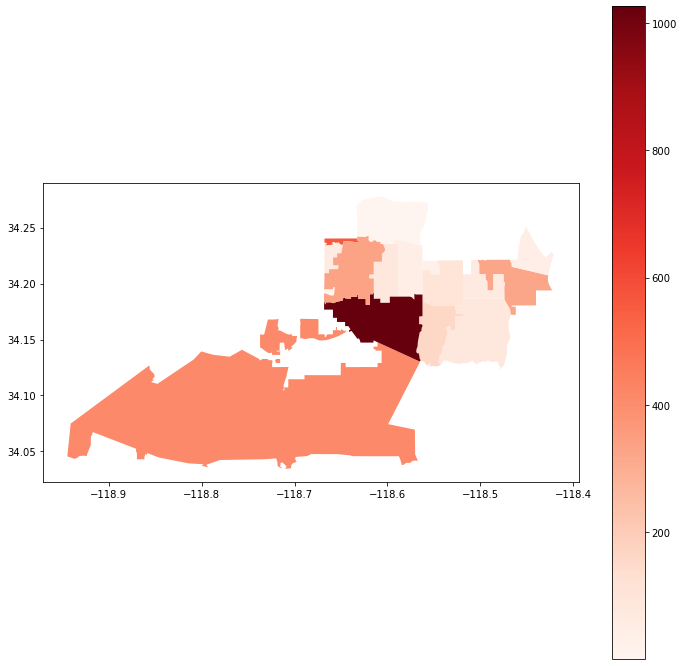

In [44]:
# choropleth map of vacant lot by neighborhoods
fig,ax = plt.subplots(figsize=(12,12))

comgdf.plot(ax=ax,column='vacant_count',legend=True,cmap='Reds')

In [45]:
from keplergl import KeplerGl

# we are going to attempt to try to use KeplerGL as recommended in last week's lab
vacantmap2=KeplerGl(height=500,data={'Vacant Parcels LA':vac_par2})

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


ValueError: Can't clean for JSON: <shapely.geometry.point.Point object at 0x7eff54f4b250>

In [47]:
# show me distinct value of charges
vac_par2.grp_description.unique().tolist()

AttributeError: 'DataFrame' object has no attribute 'grp_description'

### Narrowing our scope: El Sereno and Lincoln Heights

As we learn how to bring in API by location parameters, we hope to also created a focused map in our neighborhoods of interest mentioned in our updated proposal. We will set the stage by doing further data exploration to narrow this down for future use!

In [ ]:
# for general data wrangling tasks
import pandas as pd

# to read and visualize spatial data
import geopandas as gpd

# to provide basemaps 
import contextily as ctx

# to give more power to your figures (plots)
import matplotlib.pyplot as plt

In [48]:
# project to web meracator

comgdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [49]:
#locating the records for these 2 neighbrohoods

comgdf_new = comgdf.loc[[116,152]]

In [50]:
comgdf_new.head()

,community,source,label,city_type,objectid,lcity,shape_stlength,shape_starea,geometry,vac_count,vacant_count
116,El Sereno,LA City,Los Angeles - El Sereno,City,78,Los Angeles,57287.733092284157,109050969.50683594,"MULTIPOLYGON (((-118.15536 34.09867, -118.1553...",NaN,NaN
152,Lincoln Heights,LA City,Los Angeles - Lincoln Heights,City,108,Los Angeles,60756.009942239587,91056715.407226563,"MULTIPOLYGON (((-118.19006 34.09722, -118.1903...",NaN,NaN


<AxesSubplot:>

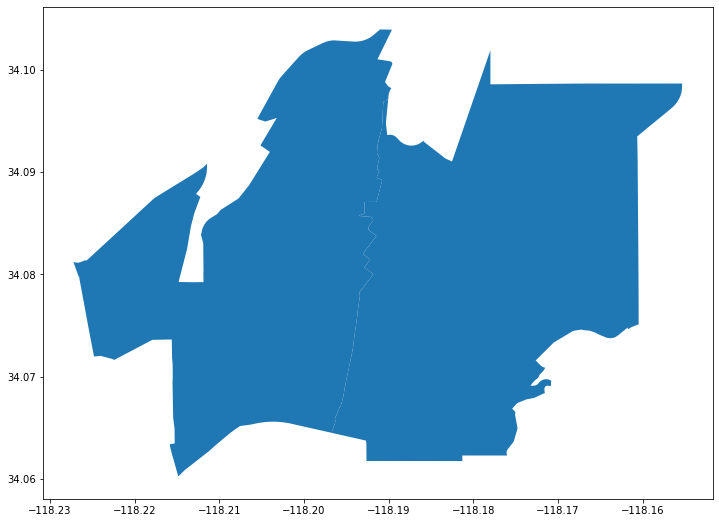

In [51]:
#plot it to see if we did this right

comgdf_new.plot(figsize=(12,12))

/opt/conda/lib/python3.9/site-packages/contextily/tile.py:581: UserWarning:

The inferred zoom level of 31 is not valid for the current tile provider (valid zooms: 0 - 18).



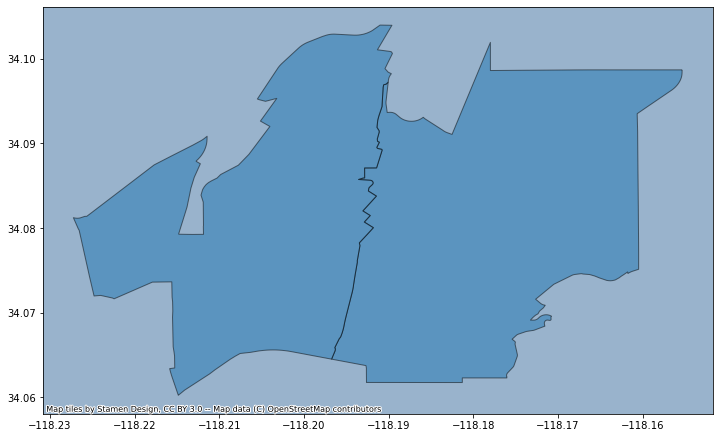

In [52]:
#we are having issues using contextlily, and will try other mapping libraries next time

ax = comgdf_new.plot(figsize=(12, 12), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax) 

Again, we are running into issues adding a map here. Lupe was able to do it on a separete noteback with Census tracts. This is something we should revist again.

### Lupe Renteria Salome
worked on data exploration of community boundaries map and coding to zoom into El Sereno and Lincoln heights.

### Mel Liu
workeds on data exploration of vacant parcel dataframe, and imported using API.

Both worked collaboratively on the code in this midterm notebook on the spatial join and interactive and static maps, as well as the graph.

Next step is to code vacant parcel counts for Lincoln Heights and Boyle Heights